<a href="https://colab.research.google.com/github/sahil3Vedi/Face-Generator/blob/master/faceGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import glob
import os
import numpy as np
from PIL import Image
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow import reduce_mean
from tensorflow.train import AdamOptimizer as adam
from tensorflow.nn import sigmoid_cross_entropy_with_logits as loss
from tensorflow.layers import dense, batch_normalization, conv2d_transpose, conv2d

In [0]:
CELEBDIR = 'drive/My Drive/celebB'

#better to provide absolute location using glob.glob()
image_ids = glob.glob('drive/My Drive/celebB/*')

crop = (30, 55, 150, 175)
images = [np.array((Image.open(i).crop(crop)).resize((64,64))) for i in image_ids]

for i in range(len(images)):
    images[i] = ((images[i] - images[i].min())/(255 - images[i].min()))
    images[i] = images[i]*2-1
    
images = np.array(images)

In [0]:
def inputs(real_dim, noise_dim):
    
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_noise = tf.placeholder(tf.float32, (None, noise_dim), name='input_noise')
    
    return inputs_real, inputs_noise

In [0]:
def generator(noise, reuse=False, alpha=0.2, training=True):
    
    with tf.variable_scope('generator', reuse=reuse):
        
        x = dense(noise, 4*4*512)
        x = tf.reshape(x, (-1, 4, 4, 512))
        x = batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        x = conv2d_transpose(x, 256, 5, 2, padding='same')
        x = batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        x = conv2d_transpose(x, 128, 5, 2, padding='same')
        x = batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        x = conv2d_transpose(x, 64, 5, 2, padding='same')
        x = batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        logits = conv2d_transpose(x, 3, 5, 2, padding='same')
        out = tf.tanh(logits)
        
        return out, logits

In [0]:
def discriminator(x, reuse=False, alpha=0.2, training=True):
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        x = conv2d(x, 32, 5, 2, padding='same')
        x = tf.maximum(alpha*x, x)
        
        x = conv2d(x, 64, 5, 2, padding='same')
        x = batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        x = conv2d(x, 128, 5, 2, padding='same')
        x = batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        x = conv2d(x, 256, 5, 2, padding='same')
        x = batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)        
        
        flatten = tf.reshape(x, (-1, 4*4*256))
        logits = dense(flatten, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

In [0]:
# hyperparameters

beta1 = 0.5
alpha = 0.2
smooth = 0.9
noise_size = 200
learning_rate = 0.0002
input_shape = (64,64,3)

In [0]:
# building the graph

tf.reset_default_graph()

input_real, input_noise = inputs(input_shape, noise_size)

gen_noise, gen_logits = generator(input_noise)

dis_out_real, dis_logits_real = discriminator(input_real)
dis_out_fake, dis_logits_fake = discriminator(gen_noise, reuse=True)

Instructions for updating:
Use keras.layers.Dense instead.
Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.batch_normalization` documentation).
Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.
Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.


In [0]:
# defining losses

shape = dis_logits_real

dis_loss_real = reduce_mean(loss(logits=dis_logits_real, labels=tf.ones_like(shape*smooth)))

dis_loss_fake = reduce_mean(loss(logits=dis_logits_fake, labels=tf.zeros_like(shape)))                             

gen_loss = reduce_mean(loss(logits=dis_logits_fake, labels=tf.ones_like(shape*smooth)))

dis_loss = dis_loss_real + dis_loss_fake


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [0]:
# defining optimizers

total_vars = tf.trainable_variables()

dis_vars = [var for var in total_vars if var.name[0] == 'd']
gen_vars = [var for var in total_vars if var.name[0] == 'g']
 
dis_opt = adam(learning_rate=learning_rate, beta1=beta1).minimize(dis_loss, var_list=dis_vars)
gen_opt = adam(learning_rate=learning_rate, beta1=beta1).minimize(gen_loss, var_list=gen_vars)

In [0]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols)
    
    for ax, img in zip(axes.flatten(), samples[epoch]):
        
        ax.axis('off')
        # img = (((img+1)/2)*255).astype(np.uint8)
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        im = ax.imshow(img)
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

512
Epoch 1/100... Batch No 1/10
Epoch 1/100... Discriminator Loss: 2.1862... Generator Loss: 0.2680


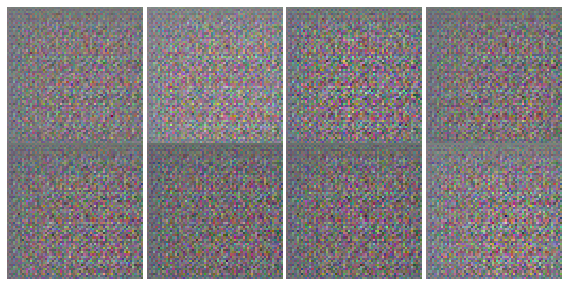

512
Epoch 2/100... Batch No 1/10
Epoch 2/100... Discriminator Loss: 0.7641... Generator Loss: 1.0896


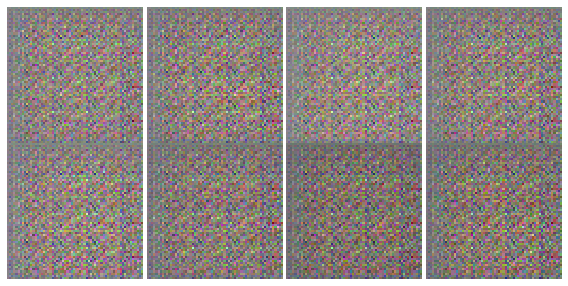

512
Epoch 3/100... Batch No 1/10
Epoch 3/100... Discriminator Loss: 0.7958... Generator Loss: 0.9144


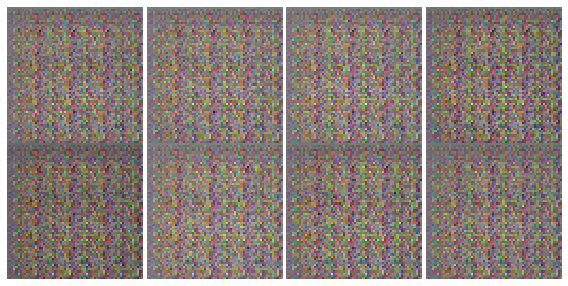

512
Epoch 4/100... Batch No 1/10
Epoch 4/100... Discriminator Loss: 0.5153... Generator Loss: 7.7109


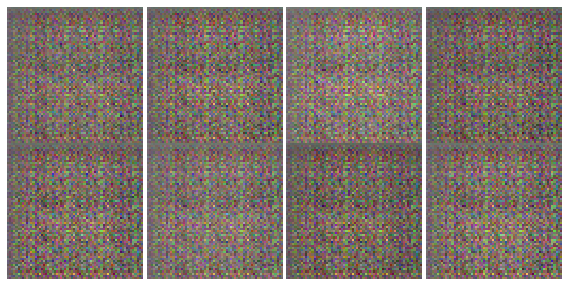

512
Epoch 5/100... Batch No 1/10
Epoch 5/100... Discriminator Loss: 0.2131... Generator Loss: 3.9480


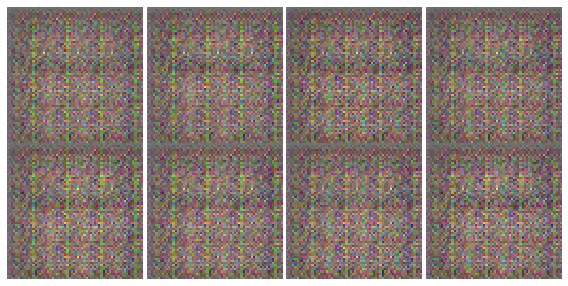

512
Epoch 6/100... Batch No 1/10
Epoch 6/100... Discriminator Loss: 0.8527... Generator Loss: 9.2681


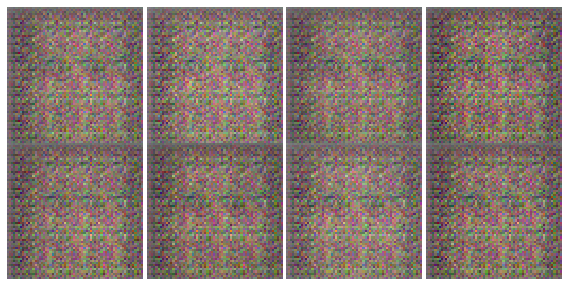

512
Epoch 7/100... Batch No 1/10
Epoch 7/100... Discriminator Loss: 0.6214... Generator Loss: 1.2149


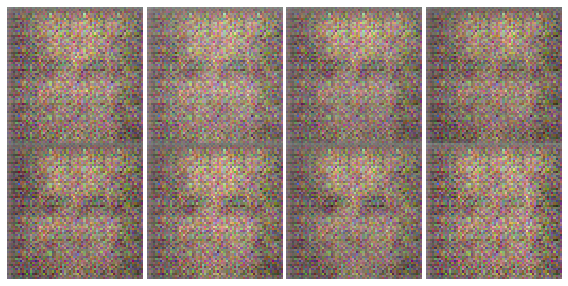

512
Epoch 8/100... Batch No 1/10
Epoch 8/100... Discriminator Loss: 0.7719... Generator Loss: 3.7547


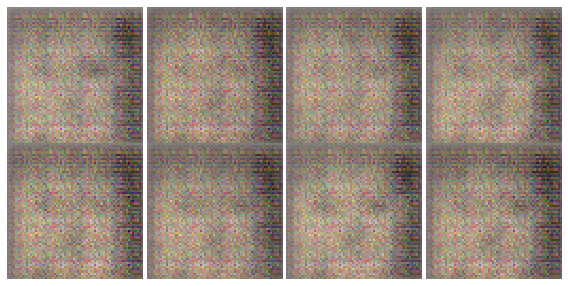

512
Epoch 9/100... Batch No 1/10
Epoch 9/100... Discriminator Loss: 1.3277... Generator Loss: 5.4950


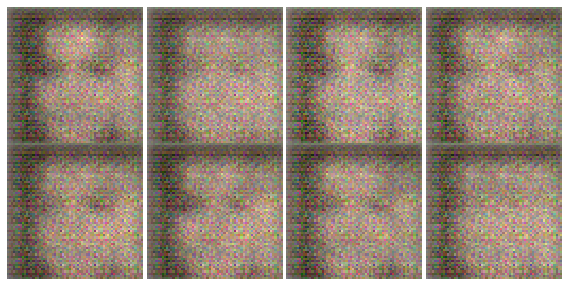

512
Epoch 10/100... Batch No 1/10
Epoch 10/100... Discriminator Loss: 0.9703... Generator Loss: 0.8802


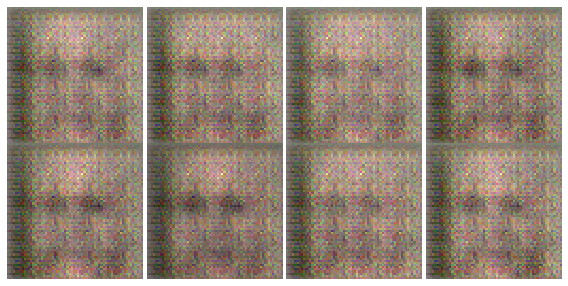

512
Epoch 11/100... Batch No 1/10
Epoch 11/100... Discriminator Loss: 1.2766... Generator Loss: 4.5480


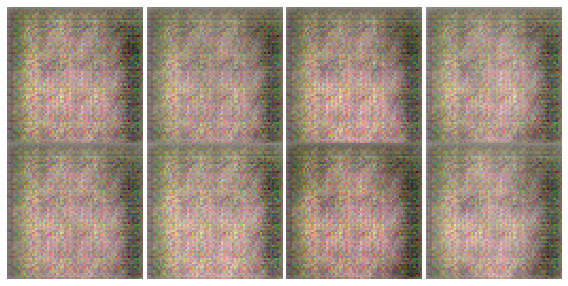

512
Epoch 12/100... Batch No 1/10
Epoch 12/100... Discriminator Loss: 1.3400... Generator Loss: 0.9106


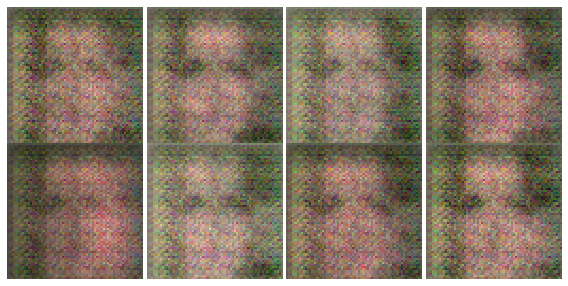

512
Epoch 13/100... Batch No 1/10
Epoch 13/100... Discriminator Loss: 1.2332... Generator Loss: 0.8152


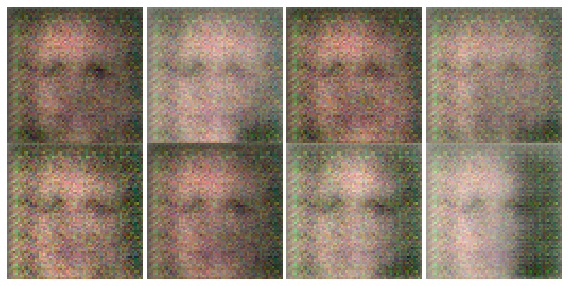

512
Epoch 14/100... Batch No 1/10
Epoch 14/100... Discriminator Loss: 1.2491... Generator Loss: 0.7243


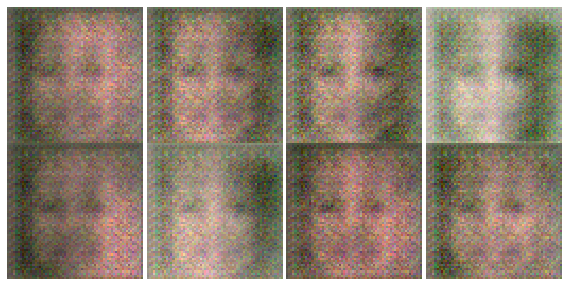

512
Epoch 15/100... Batch No 1/10
Epoch 15/100... Discriminator Loss: 1.1535... Generator Loss: 0.7730


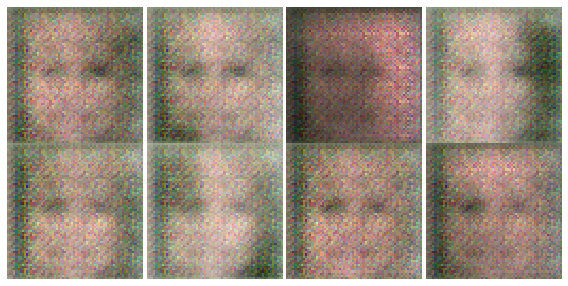

512
Epoch 16/100... Batch No 1/10
Epoch 16/100... Discriminator Loss: 1.1534... Generator Loss: 0.9833


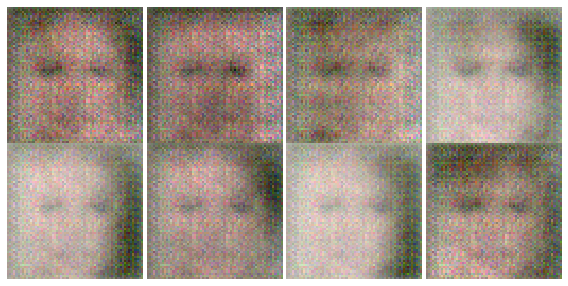

512
Epoch 17/100... Batch No 1/10
Epoch 17/100... Discriminator Loss: 1.3488... Generator Loss: 0.6148


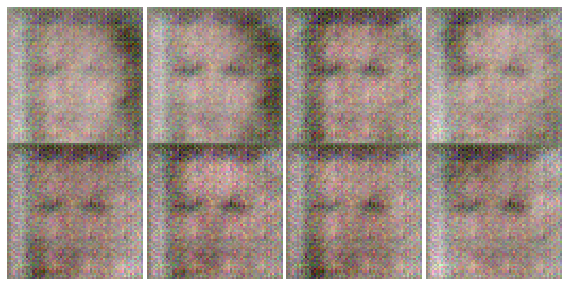

512
Epoch 18/100... Batch No 1/10
Epoch 18/100... Discriminator Loss: 1.4385... Generator Loss: 0.4547


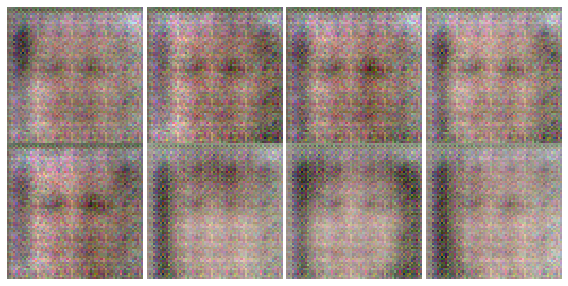

512
Epoch 19/100... Batch No 1/10
Epoch 19/100... Discriminator Loss: 1.3832... Generator Loss: 0.5393


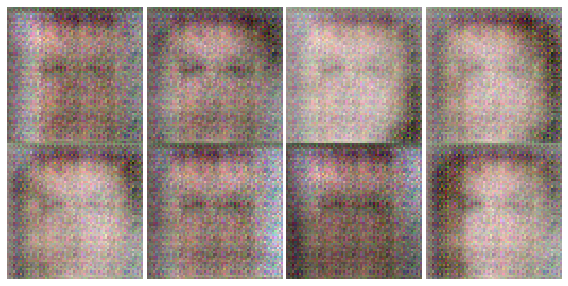

512
Epoch 20/100... Batch No 1/10
Epoch 20/100... Discriminator Loss: 0.9747... Generator Loss: 0.9106


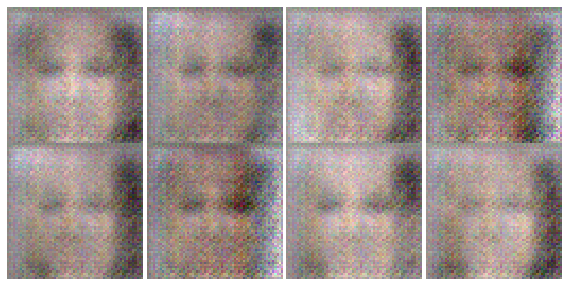

512
Epoch 21/100... Batch No 1/10
Epoch 21/100... Discriminator Loss: 1.6196... Generator Loss: 0.3615


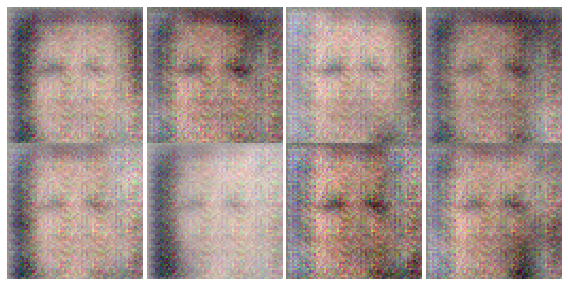

512
Epoch 22/100... Batch No 1/10
Epoch 22/100... Discriminator Loss: 1.2529... Generator Loss: 0.4802


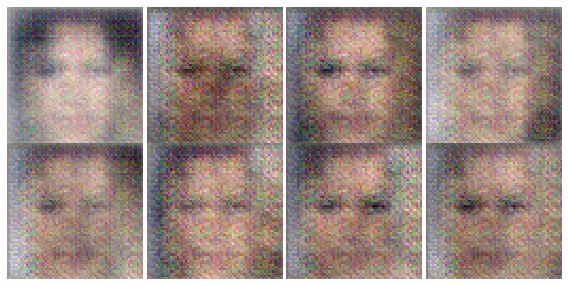

512
Epoch 23/100... Batch No 1/10
Epoch 23/100... Discriminator Loss: 1.0413... Generator Loss: 0.7163


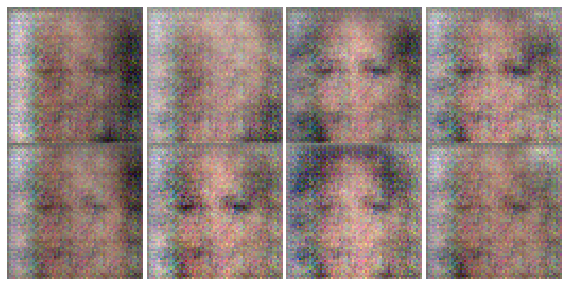

512
Epoch 24/100... Batch No 1/10
Epoch 24/100... Discriminator Loss: 1.4372... Generator Loss: 0.4150


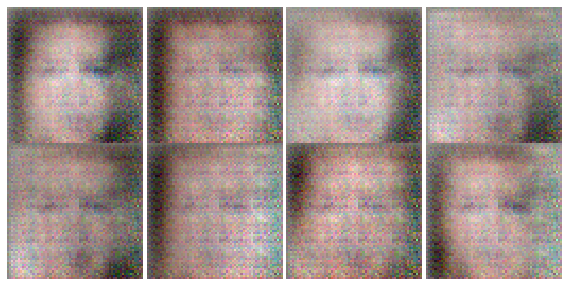

512
Epoch 25/100... Batch No 1/10
Epoch 25/100... Discriminator Loss: 1.3347... Generator Loss: 0.5259


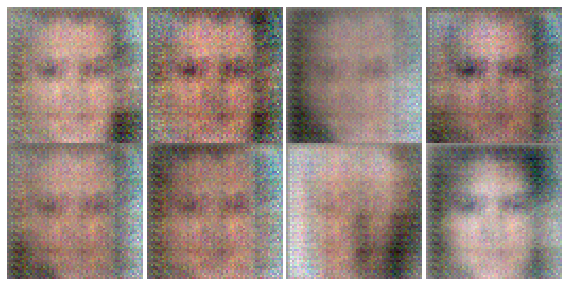

512
Epoch 26/100... Batch No 1/10
Epoch 26/100... Discriminator Loss: 0.9350... Generator Loss: 1.6085


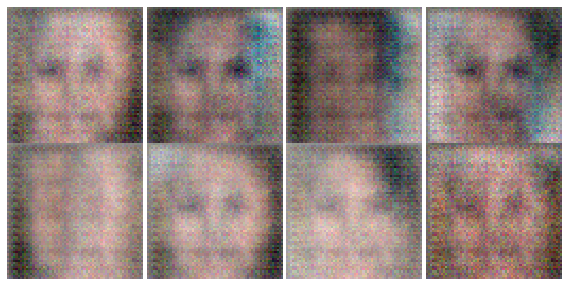

512
Epoch 27/100... Batch No 1/10
Epoch 27/100... Discriminator Loss: 0.8154... Generator Loss: 2.1568


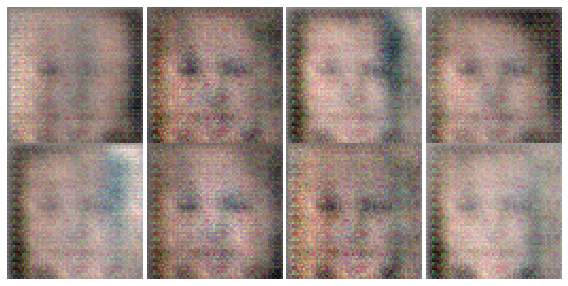

512
Epoch 28/100... Batch No 1/10
Epoch 28/100... Discriminator Loss: 1.7813... Generator Loss: 1.4113


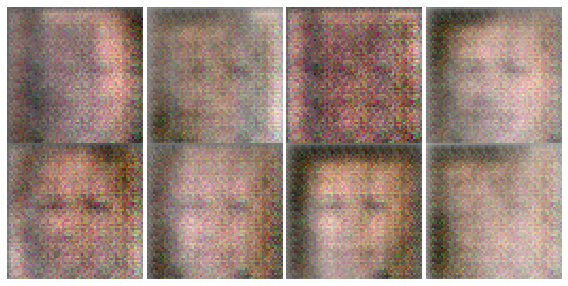

512
Epoch 29/100... Batch No 1/10
Epoch 29/100... Discriminator Loss: 1.2238... Generator Loss: 0.5736


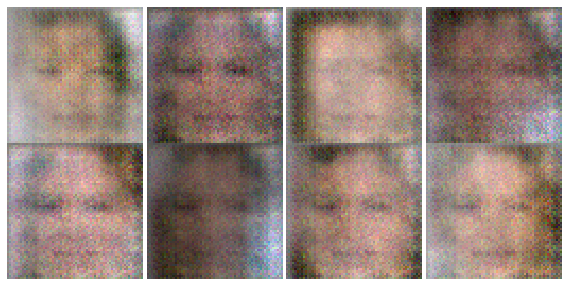

512
Epoch 30/100... Batch No 1/10
Epoch 30/100... Discriminator Loss: 1.3717... Generator Loss: 1.4604


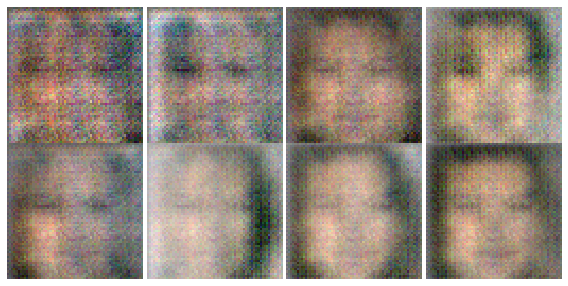

512
Epoch 31/100... Batch No 1/10
Epoch 31/100... Discriminator Loss: 1.0917... Generator Loss: 1.0085


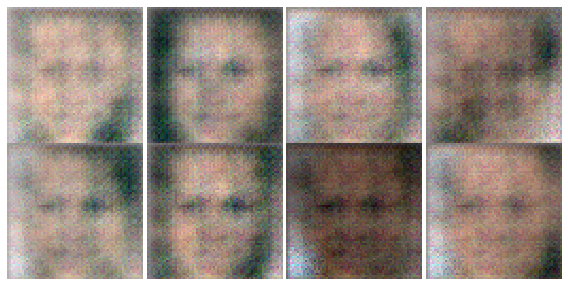

512
Epoch 32/100... Batch No 1/10
Epoch 32/100... Discriminator Loss: 0.8626... Generator Loss: 1.4162


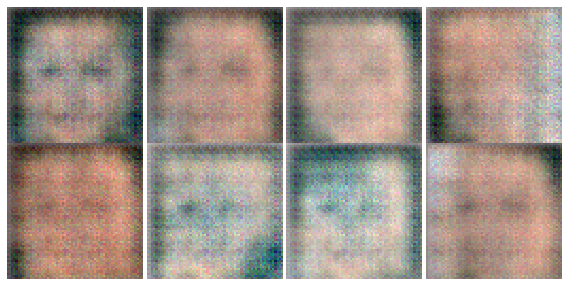

512
Epoch 33/100... Batch No 1/10
Epoch 33/100... Discriminator Loss: 0.8975... Generator Loss: 1.1880


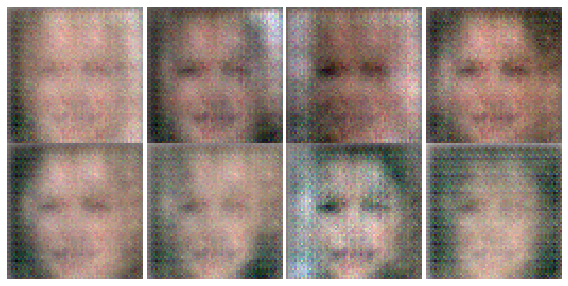

512
Epoch 34/100... Batch No 1/10
Epoch 34/100... Discriminator Loss: 0.9483... Generator Loss: 0.9497


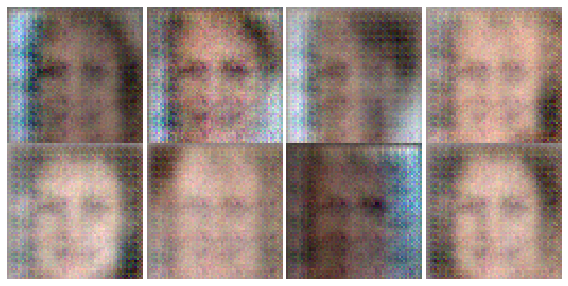

512
Epoch 35/100... Batch No 1/10
Epoch 35/100... Discriminator Loss: 1.5118... Generator Loss: 0.8311


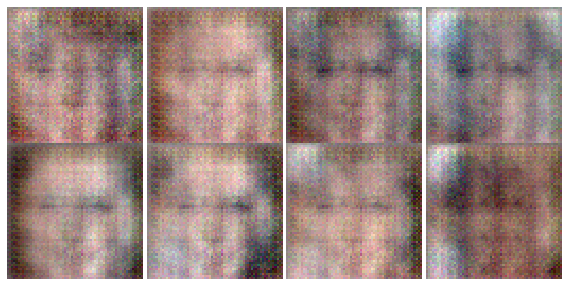

512
Epoch 36/100... Batch No 1/10
Epoch 36/100... Discriminator Loss: 1.2119... Generator Loss: 0.6454


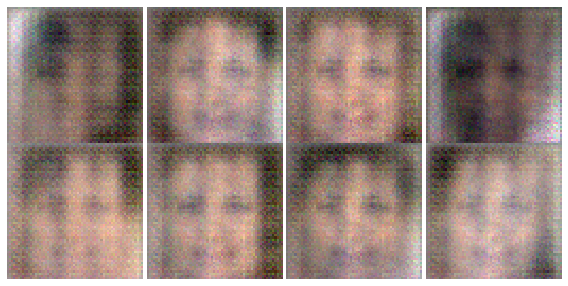

512
Epoch 37/100... Batch No 1/10
Epoch 37/100... Discriminator Loss: 1.5103... Generator Loss: 0.3650


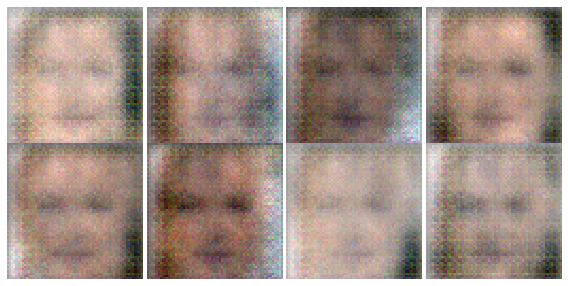

512
Epoch 38/100... Batch No 1/10
Epoch 38/100... Discriminator Loss: 1.1887... Generator Loss: 0.7535


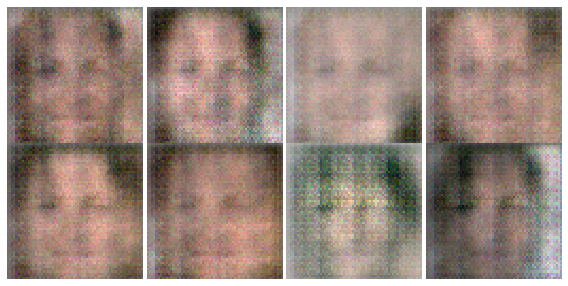

512
Epoch 39/100... Batch No 1/10
Epoch 39/100... Discriminator Loss: 1.0988... Generator Loss: 0.8460


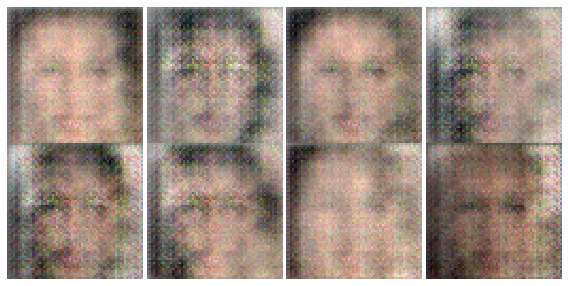

512
Epoch 40/100... Batch No 1/10
Epoch 40/100... Discriminator Loss: 1.2013... Generator Loss: 0.7433


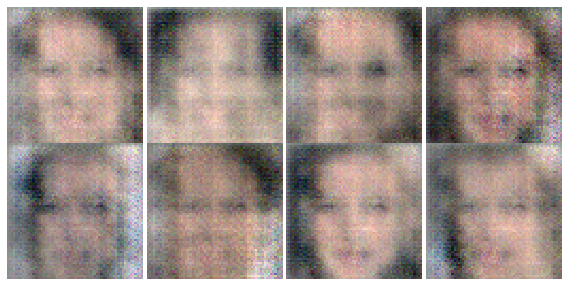

512
Epoch 41/100... Batch No 1/10
Epoch 41/100... Discriminator Loss: 1.0027... Generator Loss: 1.1008


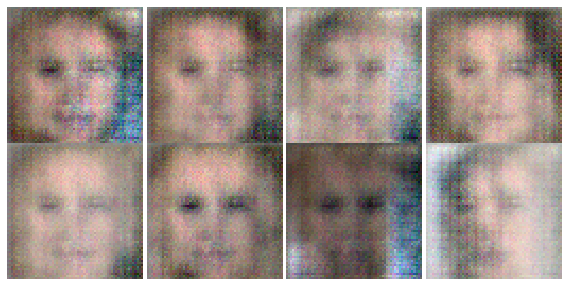

512
Epoch 42/100... Batch No 1/10
Epoch 42/100... Discriminator Loss: 0.9996... Generator Loss: 0.8522


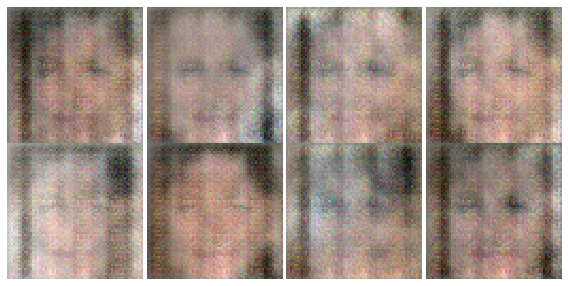

512
Epoch 43/100... Batch No 1/10
Epoch 43/100... Discriminator Loss: 0.9381... Generator Loss: 1.6479


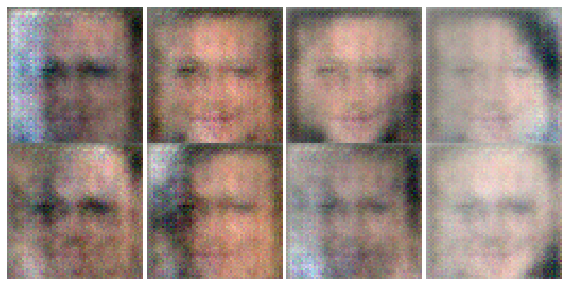

512
Epoch 44/100... Batch No 1/10
Epoch 44/100... Discriminator Loss: 1.1534... Generator Loss: 0.8794


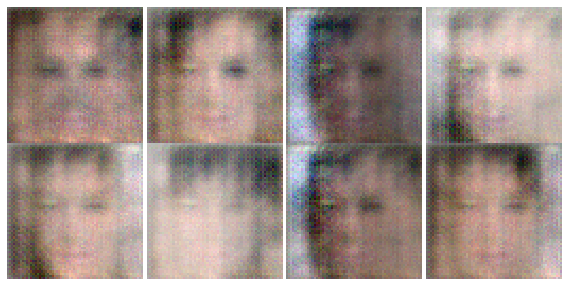

512
Epoch 45/100... Batch No 1/10
Epoch 45/100... Discriminator Loss: 0.9810... Generator Loss: 1.1506


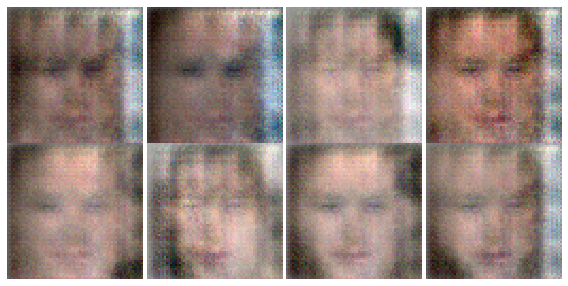

512
Epoch 46/100... Batch No 1/10
Epoch 46/100... Discriminator Loss: 1.0759... Generator Loss: 0.8091


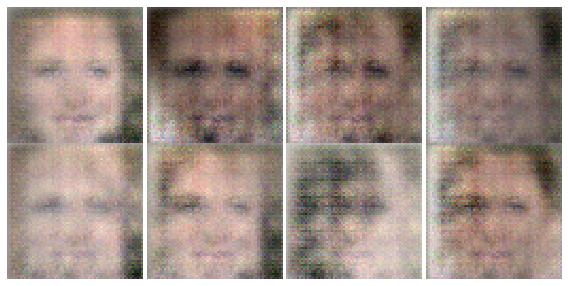

512
Epoch 47/100... Batch No 1/10
Epoch 47/100... Discriminator Loss: 1.0476... Generator Loss: 0.8059


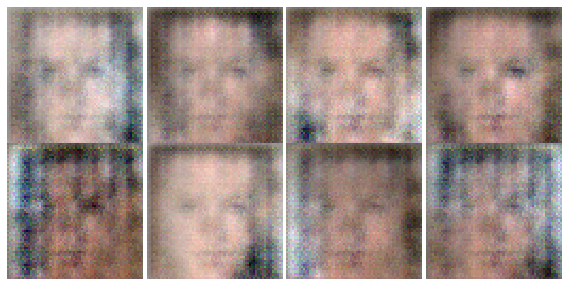

512
Epoch 48/100... Batch No 1/10
Epoch 48/100... Discriminator Loss: 1.0642... Generator Loss: 1.5386


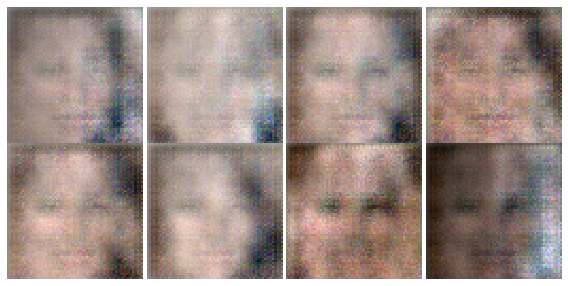

512
Epoch 49/100... Batch No 1/10
Epoch 49/100... Discriminator Loss: 0.8408... Generator Loss: 1.1002


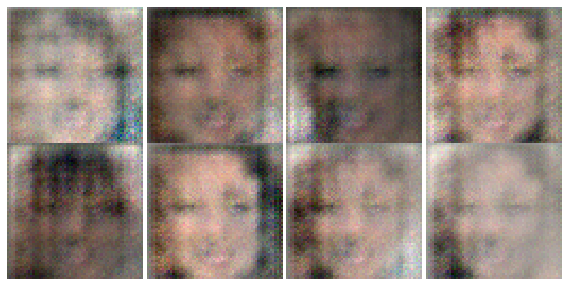

512
Epoch 50/100... Batch No 1/10
Epoch 50/100... Discriminator Loss: 1.0172... Generator Loss: 1.1720


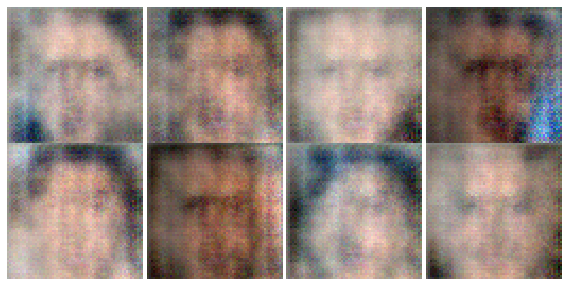

512
Epoch 51/100... Batch No 1/10
Epoch 51/100... Discriminator Loss: 0.8608... Generator Loss: 1.8777


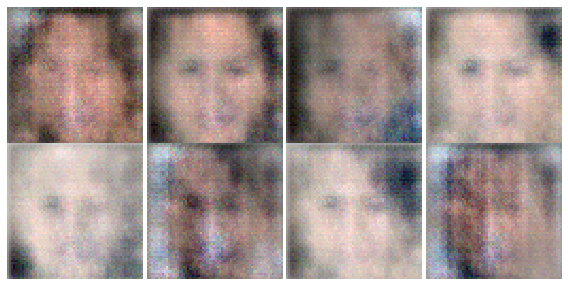

512
Epoch 52/100... Batch No 1/10
Epoch 52/100... Discriminator Loss: 1.1326... Generator Loss: 1.2183


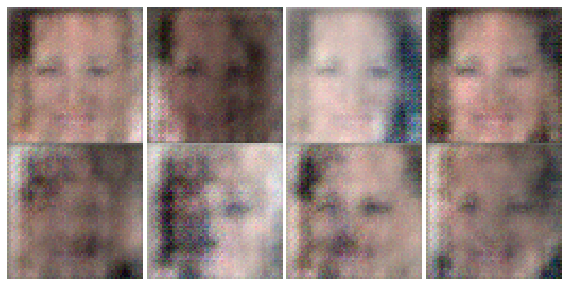

512
Epoch 53/100... Batch No 1/10
Epoch 53/100... Discriminator Loss: 0.7346... Generator Loss: 1.1574


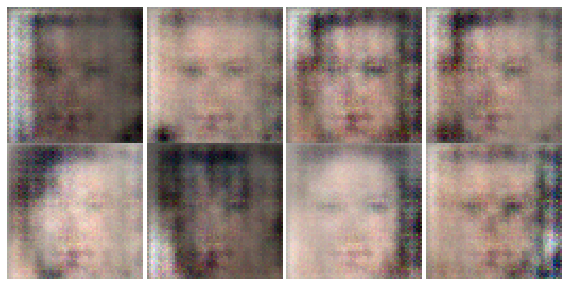

512
Epoch 54/100... Batch No 1/10
Epoch 54/100... Discriminator Loss: 1.2258... Generator Loss: 1.2859


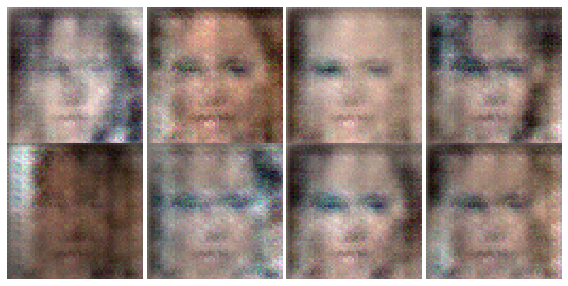

512
Epoch 55/100... Batch No 1/10
Epoch 55/100... Discriminator Loss: 0.8187... Generator Loss: 1.2527


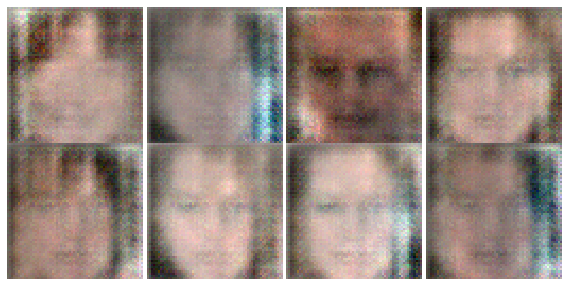

512
Epoch 56/100... Batch No 1/10
Epoch 56/100... Discriminator Loss: 0.8950... Generator Loss: 1.0846


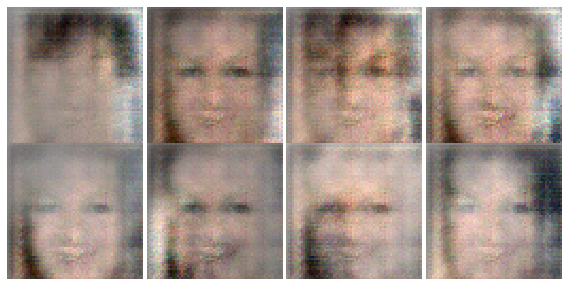

512
Epoch 57/100... Batch No 1/10
Epoch 57/100... Discriminator Loss: 1.5531... Generator Loss: 0.4006


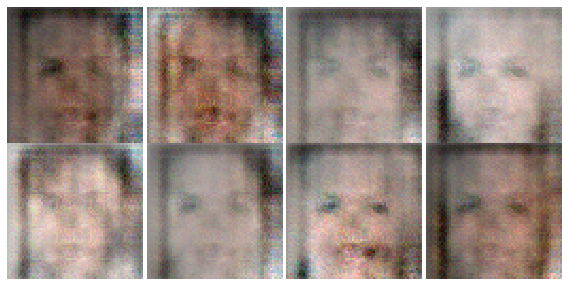

512
Epoch 58/100... Batch No 1/10
Epoch 58/100... Discriminator Loss: 0.7555... Generator Loss: 1.2620


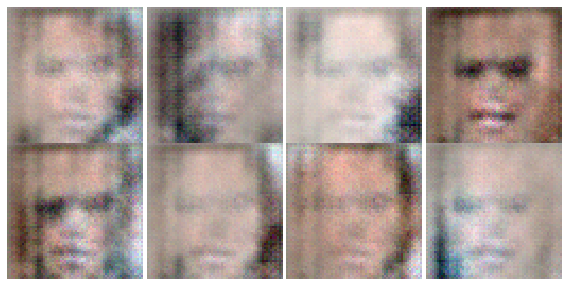

512
Epoch 59/100... Batch No 1/10
Epoch 59/100... Discriminator Loss: 1.0297... Generator Loss: 0.8740


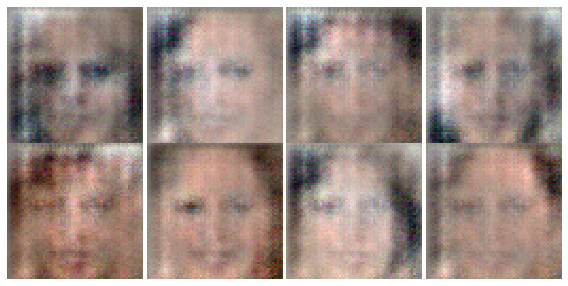

512
Epoch 60/100... Batch No 1/10
Epoch 60/100... Discriminator Loss: 0.8740... Generator Loss: 1.1230


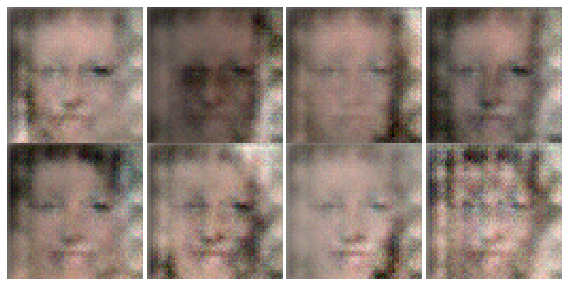

512
Epoch 61/100... Batch No 1/10
Epoch 61/100... Discriminator Loss: 1.1752... Generator Loss: 0.5735


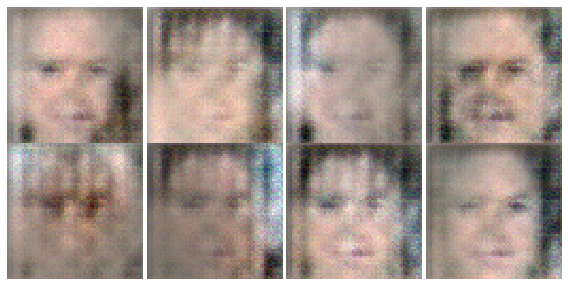

512
Epoch 62/100... Batch No 1/10
Epoch 62/100... Discriminator Loss: 0.8820... Generator Loss: 1.3544


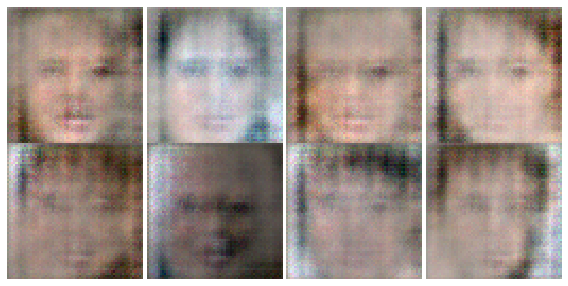

512
Epoch 63/100... Batch No 1/10
Epoch 63/100... Discriminator Loss: 0.8527... Generator Loss: 1.1592


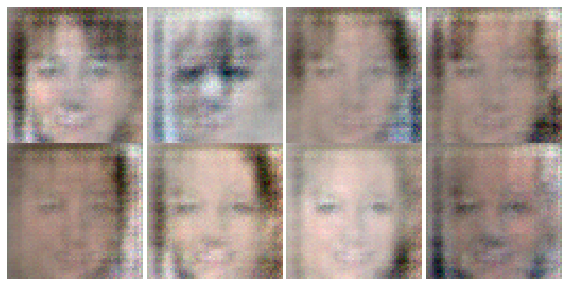

512
Epoch 64/100... Batch No 1/10
Epoch 64/100... Discriminator Loss: 1.0211... Generator Loss: 1.1953


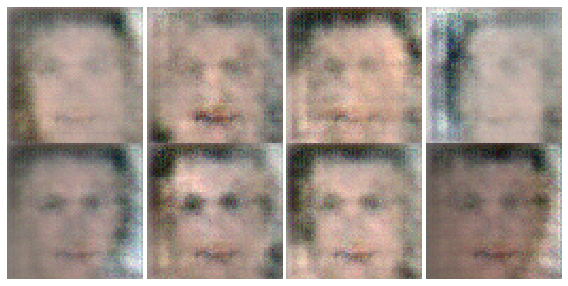

512
Epoch 65/100... Batch No 1/10
Epoch 65/100... Discriminator Loss: 1.1108... Generator Loss: 0.8849


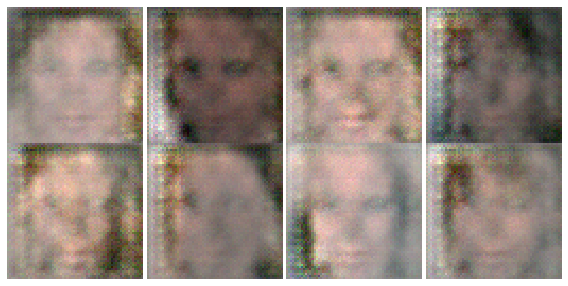

512
Epoch 66/100... Batch No 1/10
Epoch 66/100... Discriminator Loss: 1.0508... Generator Loss: 1.1599


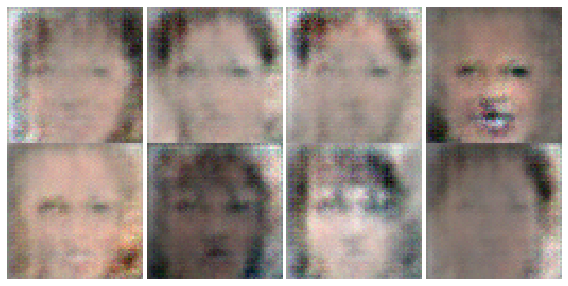

512
Epoch 67/100... Batch No 1/10
Epoch 67/100... Discriminator Loss: 0.9376... Generator Loss: 1.0217


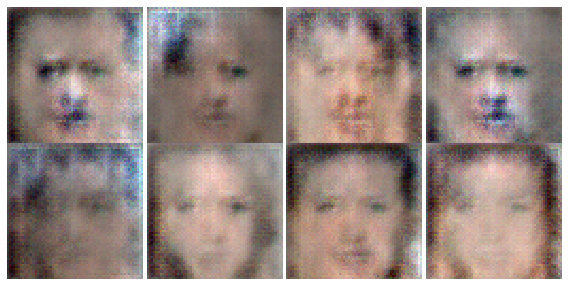

512
Epoch 68/100... Batch No 1/10
Epoch 68/100... Discriminator Loss: 1.0933... Generator Loss: 0.8237


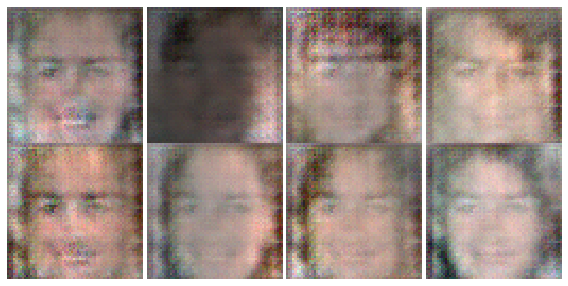

512
Epoch 69/100... Batch No 1/10
Epoch 69/100... Discriminator Loss: 0.9766... Generator Loss: 1.1371


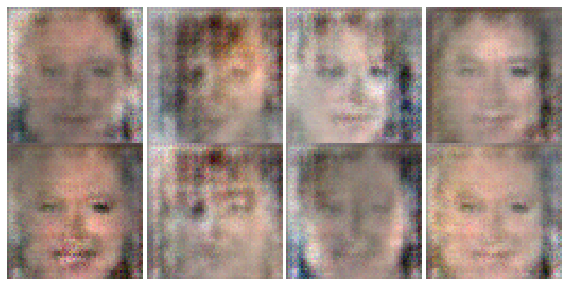

512
Epoch 70/100... Batch No 1/10
Epoch 70/100... Discriminator Loss: 1.1698... Generator Loss: 0.6337


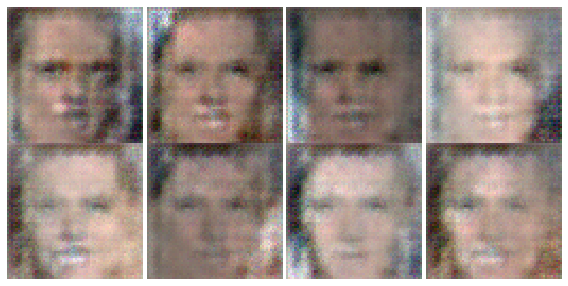

512
Epoch 71/100... Batch No 1/10
Epoch 71/100... Discriminator Loss: 0.9960... Generator Loss: 0.9004


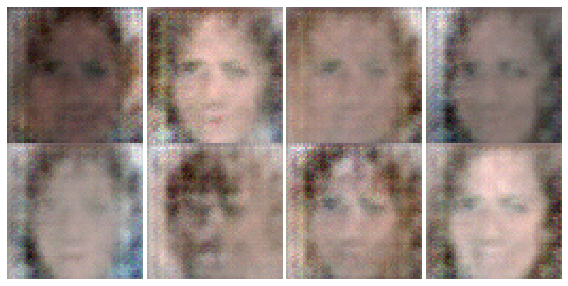

512
Epoch 72/100... Batch No 1/10
Epoch 72/100... Discriminator Loss: 0.9034... Generator Loss: 1.0749


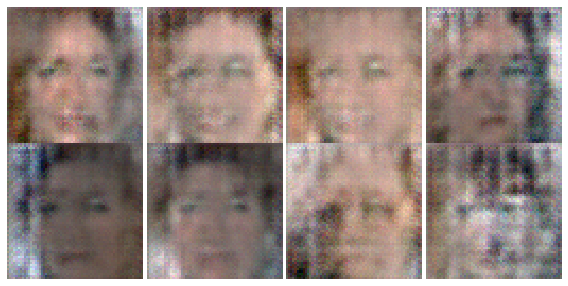

512
Epoch 73/100... Batch No 1/10
Epoch 73/100... Discriminator Loss: 0.8020... Generator Loss: 1.2122


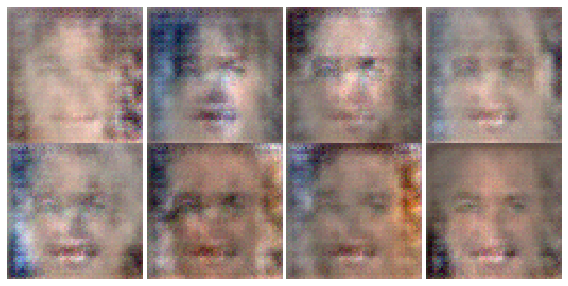

512
Epoch 74/100... Batch No 1/10
Epoch 74/100... Discriminator Loss: 0.9860... Generator Loss: 0.8887


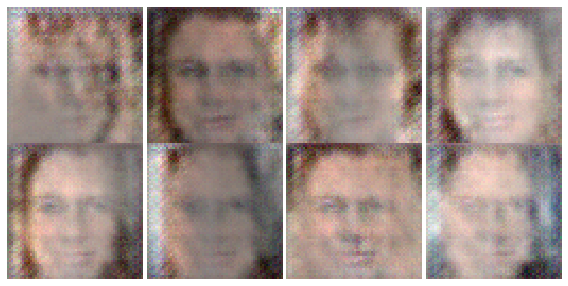

512
Epoch 75/100... Batch No 1/10
Epoch 75/100... Discriminator Loss: 0.8631... Generator Loss: 1.2756


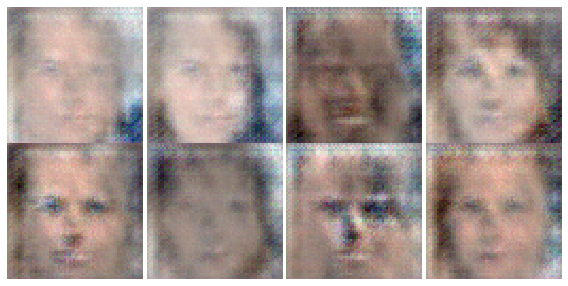

512
Epoch 76/100... Batch No 1/10
Epoch 76/100... Discriminator Loss: 1.1202... Generator Loss: 0.5996


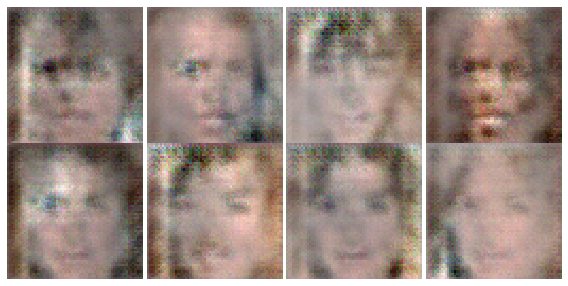

512
Epoch 77/100... Batch No 1/10
Epoch 77/100... Discriminator Loss: 0.9131... Generator Loss: 0.8937


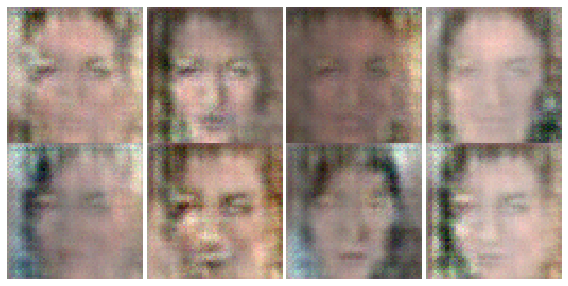

512
Epoch 78/100... Batch No 1/10
Epoch 78/100... Discriminator Loss: 0.9063... Generator Loss: 0.8821


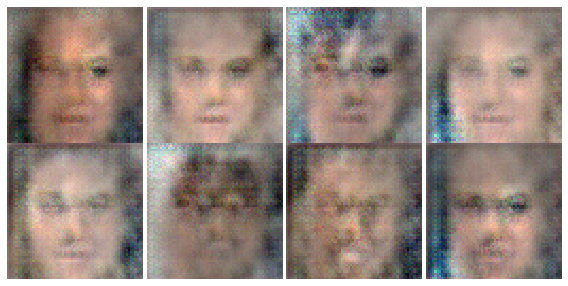

512
Epoch 79/100... Batch No 1/10
Epoch 79/100... Discriminator Loss: 0.9926... Generator Loss: 0.6455


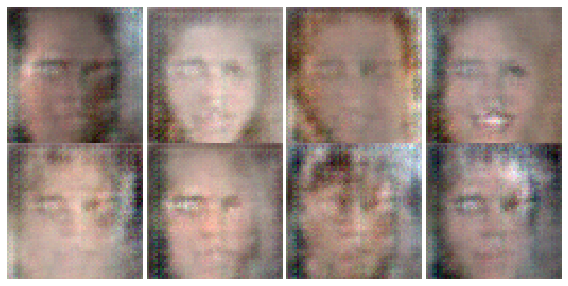

512
Epoch 80/100... Batch No 1/10
Epoch 80/100... Discriminator Loss: 0.8800... Generator Loss: 1.4041


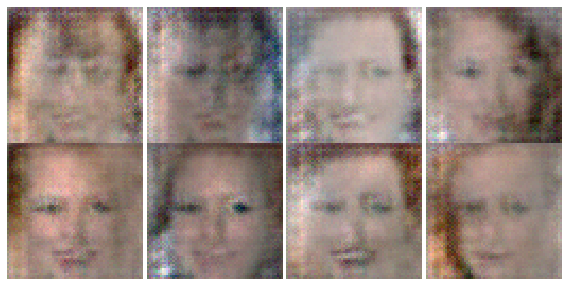

512
Epoch 81/100... Batch No 1/10
Epoch 81/100... Discriminator Loss: 1.0251... Generator Loss: 0.8997


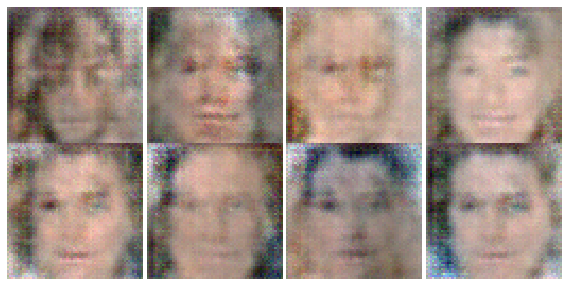

512
Epoch 82/100... Batch No 1/10
Epoch 82/100... Discriminator Loss: 0.8352... Generator Loss: 1.1673


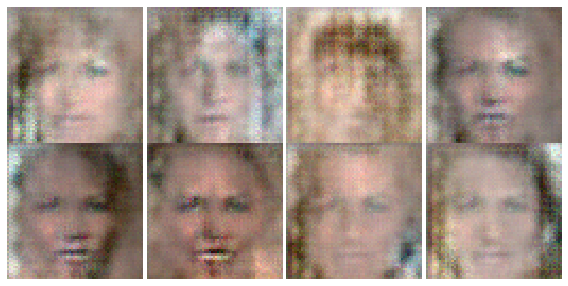

512
Epoch 83/100... Batch No 1/10
Epoch 83/100... Discriminator Loss: 1.0137... Generator Loss: 0.9296


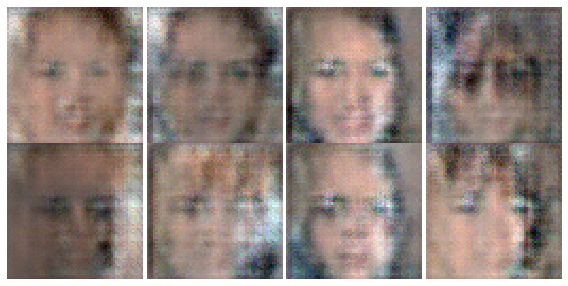

512
Epoch 84/100... Batch No 1/10
Epoch 84/100... Discriminator Loss: 1.0935... Generator Loss: 1.1727


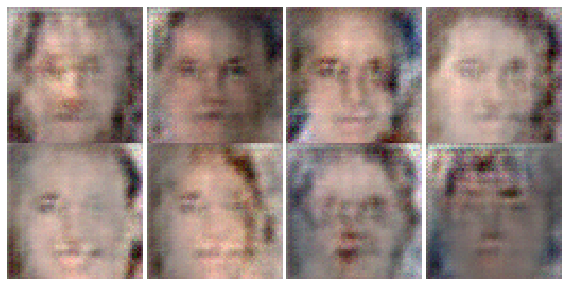

512
Epoch 85/100... Batch No 1/10
Epoch 85/100... Discriminator Loss: 0.9950... Generator Loss: 0.7421


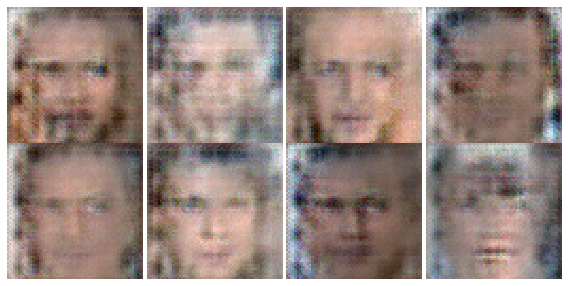

512
Epoch 86/100... Batch No 1/10
Epoch 86/100... Discriminator Loss: 0.7246... Generator Loss: 1.4224


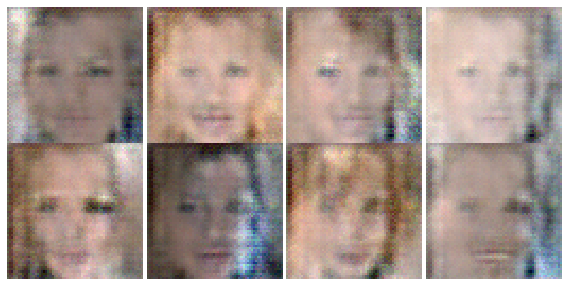

512
Epoch 87/100... Batch No 1/10
Epoch 87/100... Discriminator Loss: 0.8956... Generator Loss: 1.0346


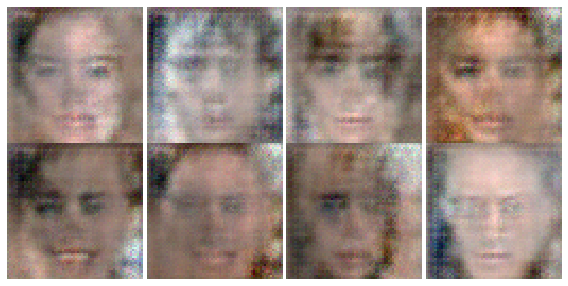

512
Epoch 88/100... Batch No 1/10
Epoch 88/100... Discriminator Loss: 0.7935... Generator Loss: 0.9420


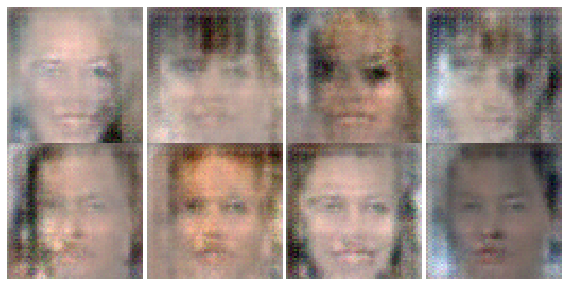

512
Epoch 89/100... Batch No 1/10
Epoch 89/100... Discriminator Loss: 0.9032... Generator Loss: 0.9021


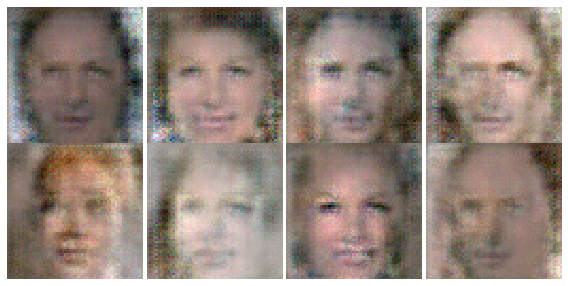

512
Epoch 90/100... Batch No 1/10
Epoch 90/100... Discriminator Loss: 0.7124... Generator Loss: 1.6306


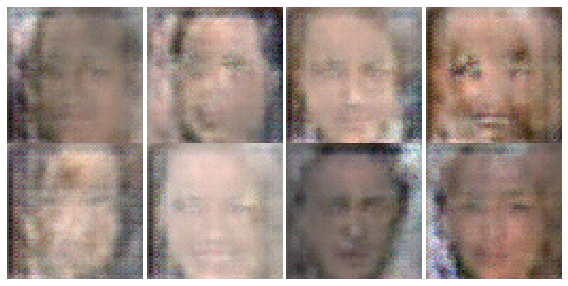

512
Epoch 91/100... Batch No 1/10
Epoch 91/100... Discriminator Loss: 0.9989... Generator Loss: 1.0120


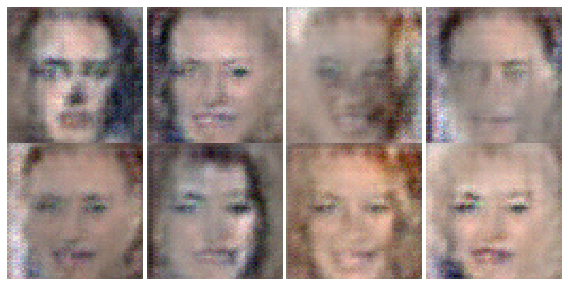

512
Epoch 92/100... Batch No 1/10
Epoch 92/100... Discriminator Loss: 0.8368... Generator Loss: 1.0298


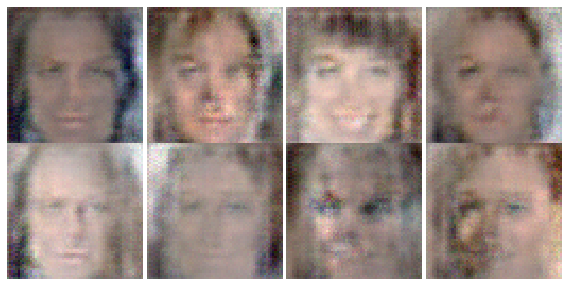

512
Epoch 93/100... Batch No 1/10
Epoch 93/100... Discriminator Loss: 0.9910... Generator Loss: 0.7360


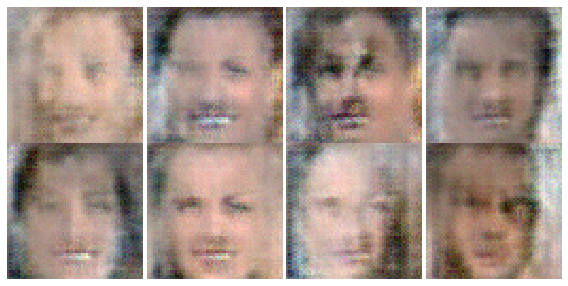

512
Epoch 94/100... Batch No 1/10
Epoch 94/100... Discriminator Loss: 0.8986... Generator Loss: 0.9247


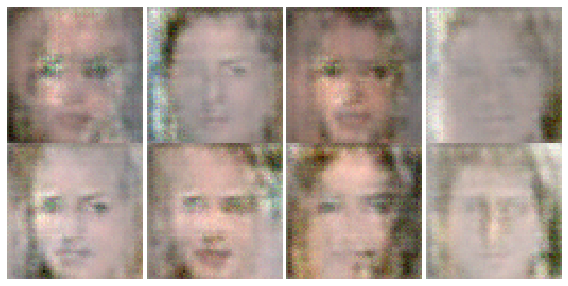

512
Epoch 95/100... Batch No 1/10
Epoch 95/100... Discriminator Loss: 0.7638... Generator Loss: 1.1982


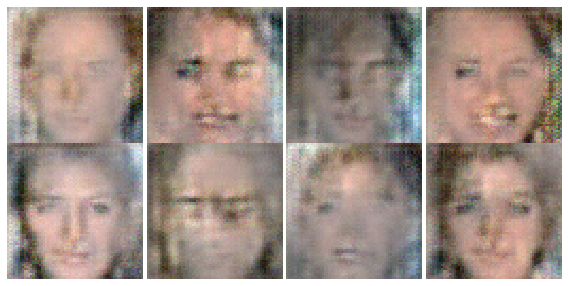

512
Epoch 96/100... Batch No 1/10
Epoch 96/100... Discriminator Loss: 0.8720... Generator Loss: 1.5124


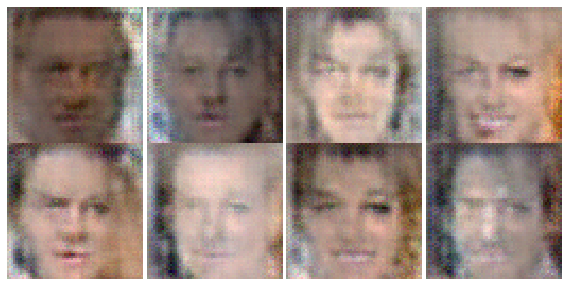

512
Epoch 97/100... Batch No 1/10
Epoch 97/100... Discriminator Loss: 0.9029... Generator Loss: 1.2226


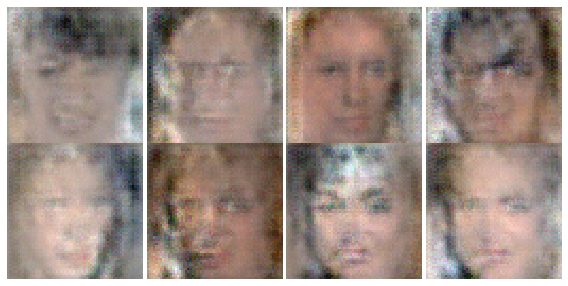

512
Epoch 98/100... Batch No 1/10
Epoch 98/100... Discriminator Loss: 0.7384... Generator Loss: 1.0933


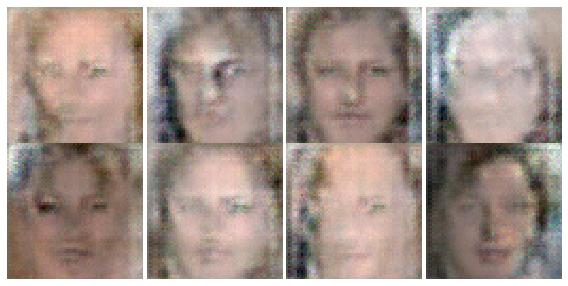

512
Epoch 99/100... Batch No 1/10
Epoch 99/100... Discriminator Loss: 0.6609... Generator Loss: 1.5327


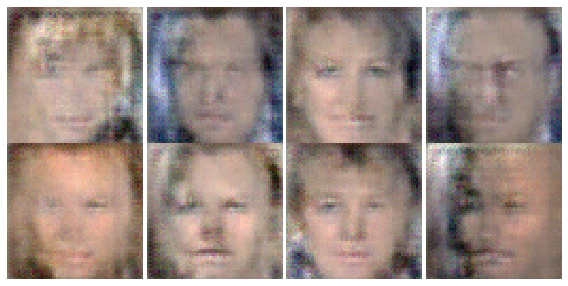

512
Epoch 100/100... Batch No 1/10
Epoch 100/100... Discriminator Loss: 0.7955... Generator Loss: 0.8776


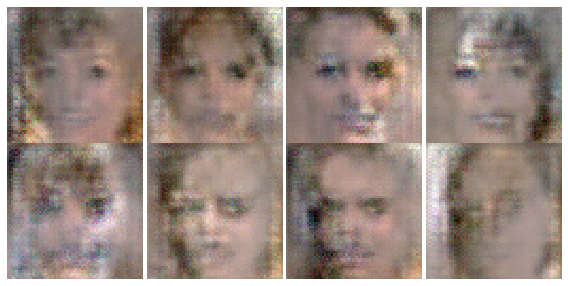

In [0]:
batch_size = 50
epochs = 100
iters = len(image_ids)//batch_size
saver = tf.train.Saver(var_list = gen_vars)

with tf.Session() as sess:
    
    sess.run(tf.global_variables_initializer())
    
    for e in range(epochs):
        print(len(image_ids))
        for i in range(iters-1):
            
            batch_images = images[i*batch_size:(i+1)*batch_size]
            batch_noise = np.random.uniform(-1, 1, size=(batch_size, noise_size))
            
            sess.run(dis_opt, feed_dict={input_real: batch_images, input_noise: batch_noise})
            sess.run(gen_opt, feed_dict={input_real: batch_images, input_noise: batch_noise})
            if i%50 == 0:
                print("Epoch {}/{}...".format(e+1, epochs), "Batch No {}/{}".format(i+1, iters))
                
        loss_dis = sess.run(dis_loss, {input_noise: batch_noise, input_real: batch_images})
        loss_gen = gen_loss.eval({input_real: batch_images, input_noise: batch_noise})
            
        print("Epoch {}/{}...".format(e+1, epochs),"Discriminator Loss: {:.4f}...".format(loss_dis),
              "Generator Loss: {:.4f}".format(loss_gen))      
        
        sample_noise = np.random.uniform(-1, 1, size=(8, noise_size))
        gen_samples = sess.run(generator(input_noise, reuse=True, alpha=alpha),
                               feed_dict={input_noise: sample_noise})

        view_samples(-1, gen_samples, 2, 4, (10,5))
        plt.show()
        saver.save(sess, './checkpoints/generator.ckpt')